In [15]:
import torch as t
import torchvision as tv
import torchvision.transforms as transforms
import torch.optim as optim
from PIL import Image
from torchvision.transforms import Grayscale
import copy

In [48]:
import torchvision
print(torchvision.__version__)

0.15.2a0



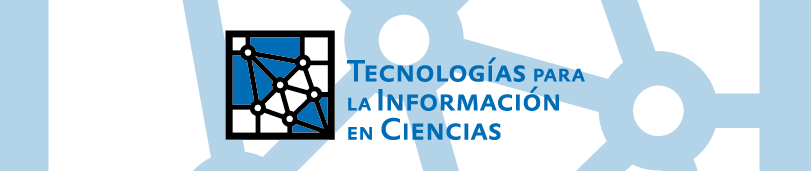  

Zamorano Presa Miguel Ángel

# Tarea pytorch, parte B

Recuerda que no se vale utilizar la palabra `for`.


1. Carga una imagen y muéstrala cortada a la mitad horizontalmente, dejando la parte de arriba.
3. Muestra la imagen cortada a la mitad verticalmente, dejando la parte derecha.
4. Llena la mitad de la imagen diagonalmente (tú escoge la diagonal) con negro y muestra la imagen.
5. Convierte la imagen a escala de grises (directo con pytorch, obviamente)
6. Encuentra el **color promedio** de la imagen.
7. Para cada pixel, pon como 0 aquellos valores que estén debajo del promedio (de su propio color).
8. Todos los pixeles que sean mayormente azules conviértelos a blanco y negro. Los pixeles mayormente rojos o verdes déjalos como están.
9. Crea una imagen que parezca un tablero de ajedrez.
10. Crea una imagen que parezca ruido de televisión (e.g. aleatorio pero en escala de grises)
11. Crea una imagen que parezca una gradiente horizontal y luego una gradiente vertical.

En todos los siguientes ejercicios, encuentra soluciones aproximadas!

11. Encuentra un mínimo local de $\cos(x)$.
13. Encuentra una raíz de $\sin(x+1) + x\cos(2x^2)$
14. Encuentra una raiz de $\sin(x) + \cos(y+1)$ que satisfaga $\sqrt{|x|} + \log(1+|y|) = 2$.

### 1

In [4]:
I = Image.open("/home/sistemas/m/tics5to/5to/nn/insects.png")

In [32]:
to_t = tv.transforms.ToTensor()
X = to_t(I)
X.shape

torch.Size([3, 900, 1200])

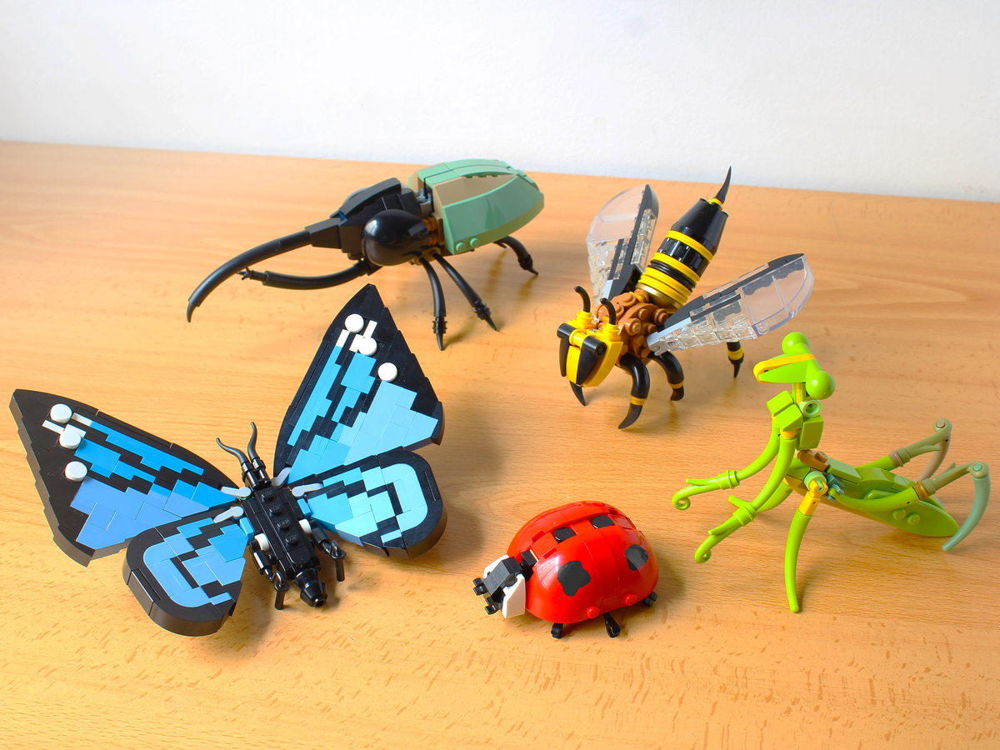

In [7]:
from torchvision.transforms import ToPILImage

to_image = ToPILImage()
to_image(X)

In [ ]:
X_up = X[:, : X.shape[2] // 2, :]

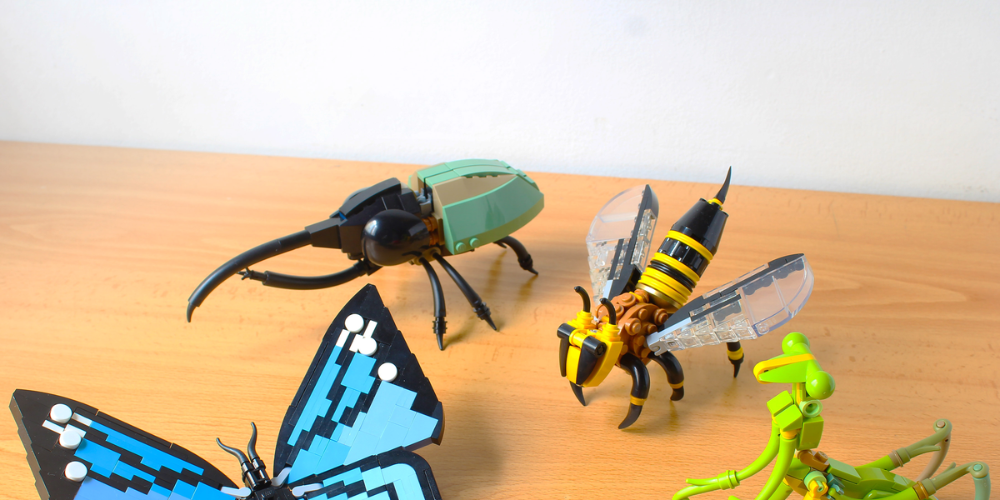

In [ ]:
to_image = tv.transforms.ToPILImage()
to_image(X_up)

## 3

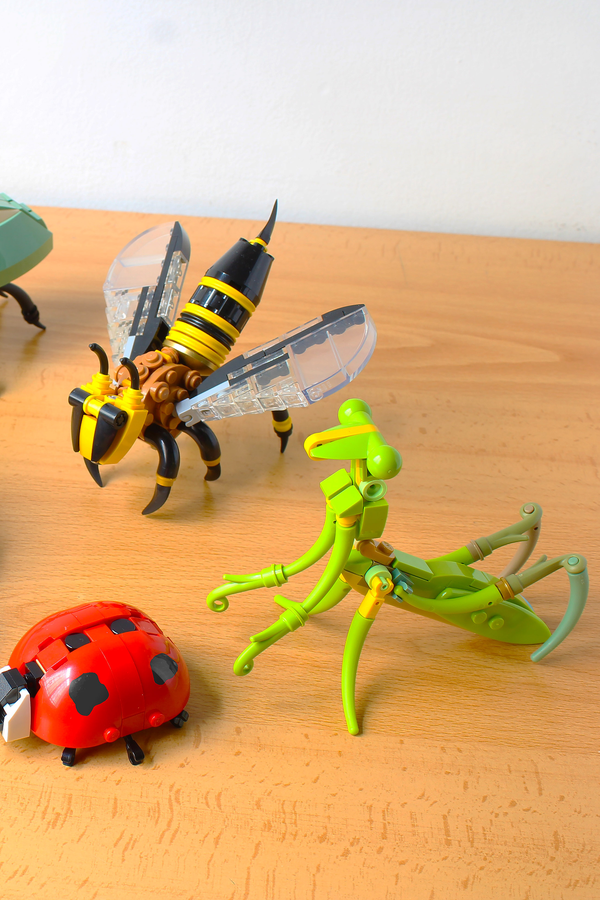

In [ ]:
X_right = X[:, :, X.shape[2] // 2 :]
to_image = tv.transforms.ToPILImage()
to_image(X_right)

## 3


In [14]:
X_half = X[:, :,  X.shape[2] // 2]
to_image(X_half)

## 4

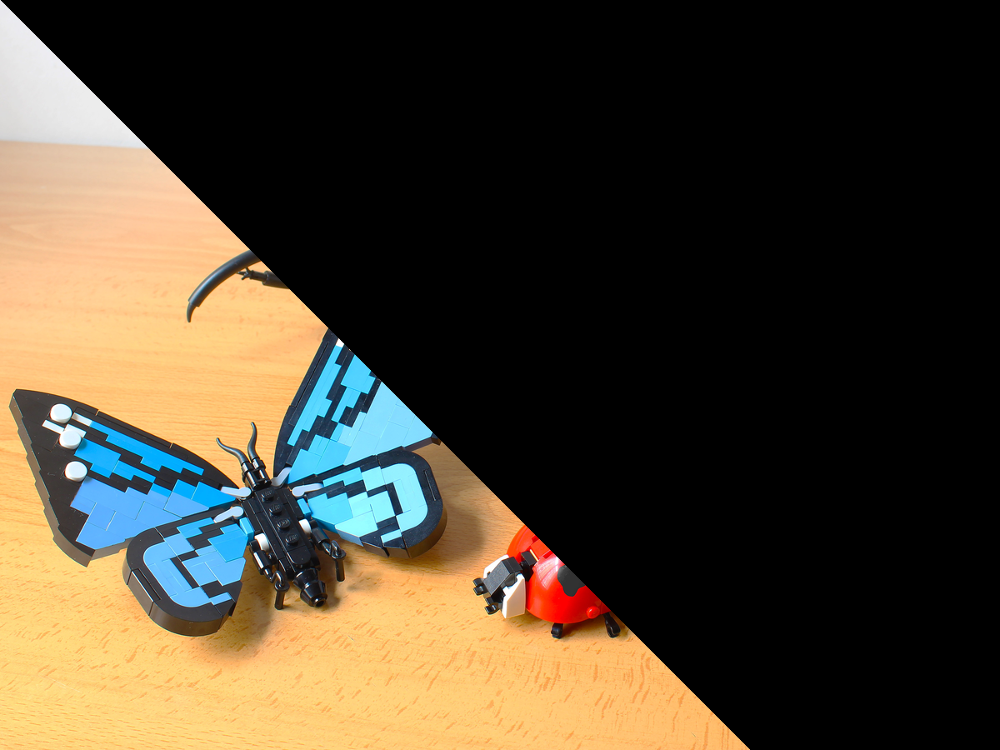

In [19]:

tensor_image = X.clone()
# Get  dim of the image
height, width = tensor_image.shape[1:]


for i in range(height):
    for j in range(width):
        if i < j:
            tensor_image[:, i, j] = 0



to_image(tensor_image)


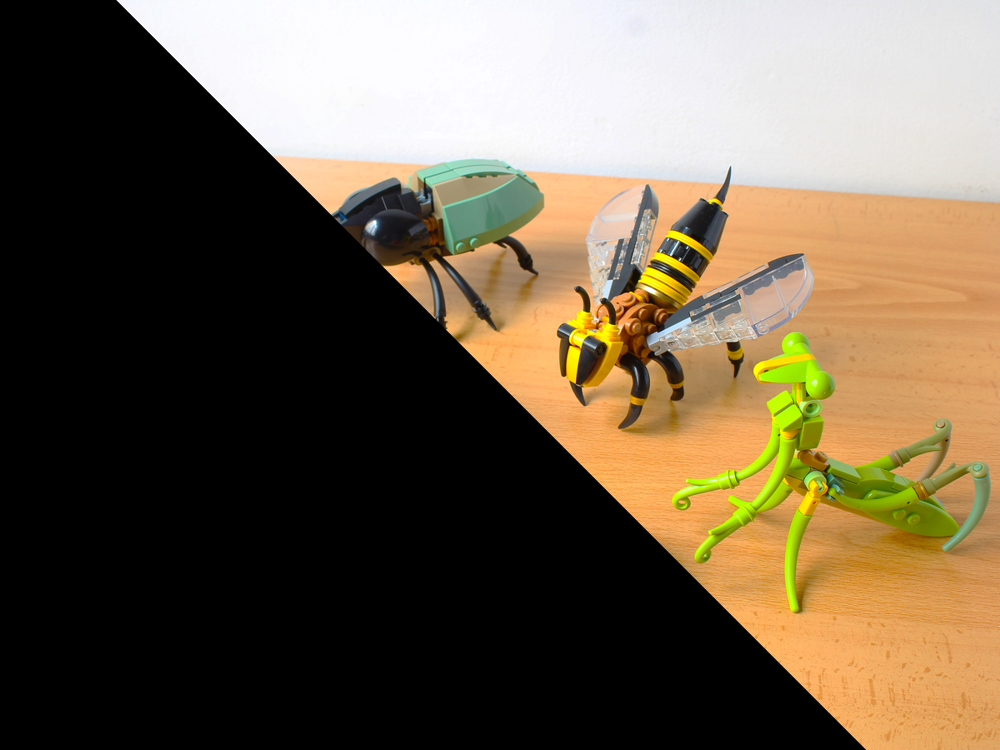

In [ ]:
X_triangular = t.triu(X, diagonal=140)
to_image(X_triangular)

## 5


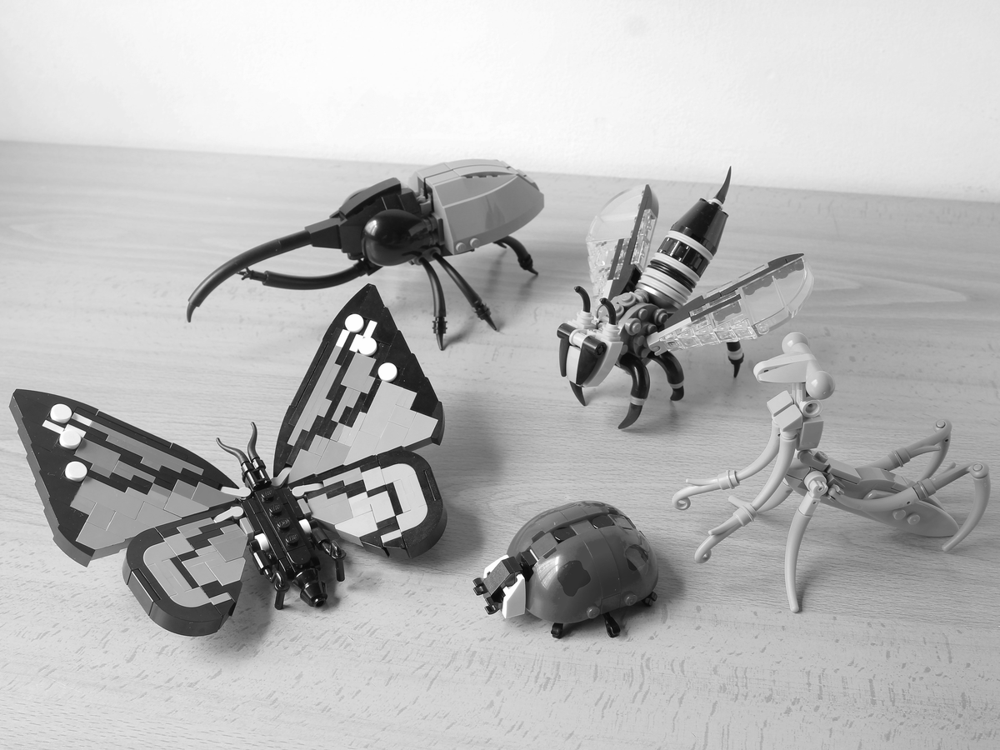

In [22]:
to_gray = Grayscale()
X_gray = to_gray(X)
to_image(X_gray)

## 6


In [23]:
mean_color = t.mean(X, dim=(1, 2))
print("Color promedio (RGB):", mean_color)


Color promedio (RGB): tensor([0.8174, 0.7022, 0.5374])


### 7

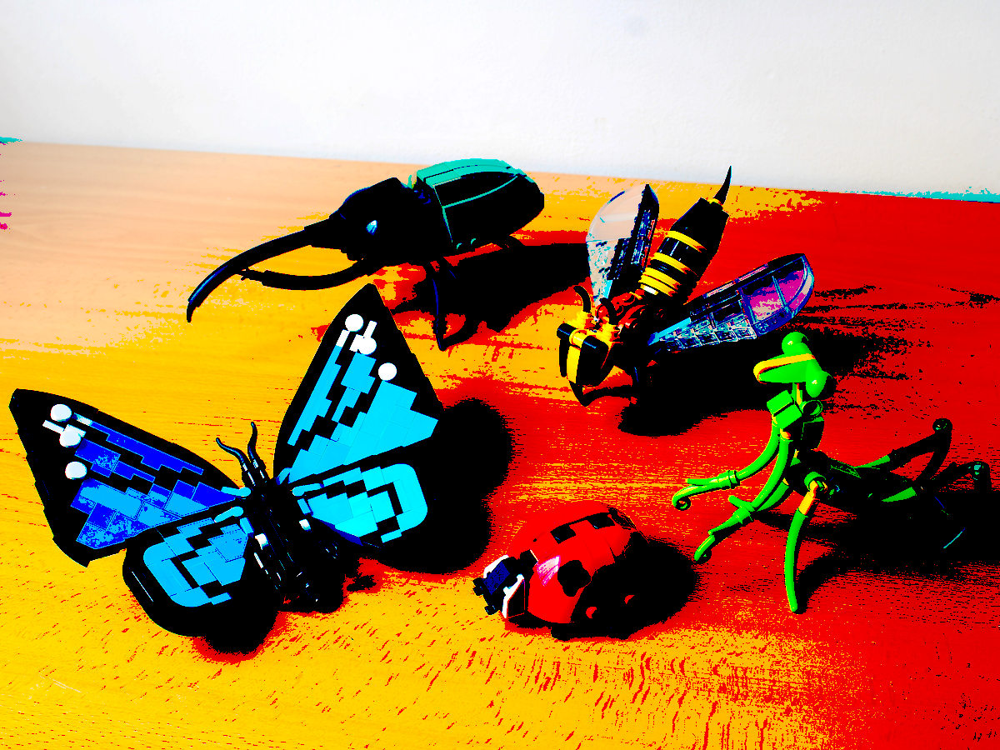

In [24]:
for i in range(X.shape[1]):
    for j in range(X.shape[2]):
        
        r, g, b = X[:, i, j]
        
        
        avg_r, avg_g, avg_b = mean_color
        
        
        if r < avg_r:
            r = 0
        if g < avg_g:
            g = 0
        if b < avg_b:
            b = 0
        
        
        X[:, i, j] = torch.tensor([r, g, b])

#
to_image(X)

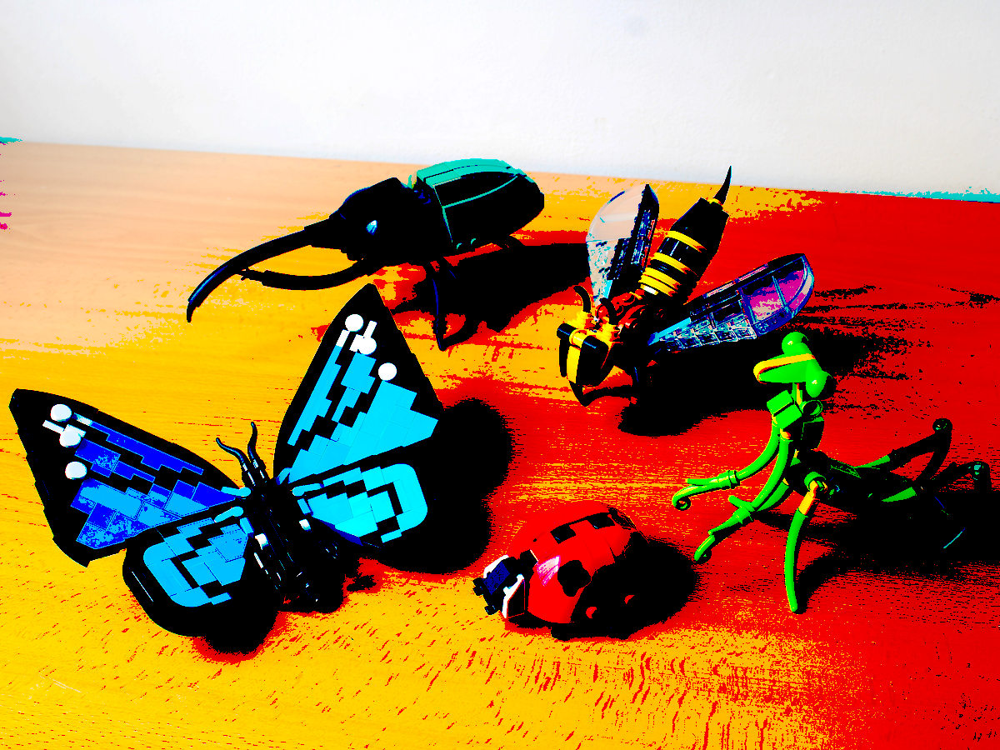

In [ ]:
mascara = X > mean_color.view(3, 1, 1)
imagen_con_mascara = X * mascara.float()
to_image(imagen_con_mascara)

## 8


In [ ]:
R, G, B = X

In [ ]:
umbral_azul = 0.51
to_b_w = t.mean(X, dim=0) > umbral_azul
to_image(to_b_w.float())


In [54]:
umbral_azul = 0.51
to_b_w = t.mean(X, dim=0) > umbral_azul
image_copy = X.clone()

# Encuentra los píxeles que son mayormente azules
blue_pixels = (image_copy[..., 2] > umbral_azul) & (image_copy[..., 2] > image_copy[..., 0]) & (image_copy[..., 2] > image_copy[..., 1])
# Imprime la cantidad de píxeles azules que encontró

blue_mask = blue_pixels.float().unsqueeze(0).expand_as(image_copy).repeat(3, 1, 1) * 0.5
n_image = image_copy * blue_mask + (1 - blue_mask) * 0.7


to_image(n_image)


RuntimeError: The expanded size of the tensor (1200) must match the existing size (900) at non-singleton dimension 2.  Target sizes: [3, 900, 1200].  Tensor sizes: [1, 3, 900]

In [47]:
# Supongamos que 'X' es tu imagen y es un tensor de PyTorch de forma (altura, anchura, 3)
# donde 3 representa los canales de color RGB.
umbral_azul = 0.5
# Crea una copia de la imagen para no modificar la original
image_copy = X.clone()

im_hsv = transforms.functional.rgb_to_hsv(image_copy)
azu = im_hsv[:, :, 2]
blue = azu > 0.51
#
# Convierte estos píxeles a blanco y negro
# Para convertir a blanco y negro, puedes promediar los canales de color
image_copy[blue] = image_copy[blue_pixels].mean(dim=1, keepdim=True)

# Ahora, 'image_copy' es tu imagen modificada
to_image(image_copy)

AttributeError: module 'torchvision.transforms.functional' has no attribute 'rgb_to_hsv'

In [41]:
# Encuentra los píxeles que son mayormente azules
blue_pixels = (image_copy[:,:,2] > umbral_azul) & (image_copy[:,:,2] > image_copy[:,:,0]) & (image_copy[:,:,2] > image_copy[:,:,1])

# Convierte estos píxeles a blanco y negro
# Para convertir a blanco y negro, puedes promediar los canales de color
mean_color = image_copy[blue_pixels].mean(dim=-1)
image_copy[blue_pixels] = mean_color.view(*mean_color.shape, 1).expand(-1, -1, 3)

# Ahora, 'image_copy' es tu imagen modificada
to_image(image_copy.float())

RuntimeError: The expanded size of the tensor (-1) isn't allowed in a leading, non-existing dimension 0

In [34]:

copia = X.clone()
# Encuentra los píxeles que son mayormente azules
blue_pixels = t.argmax(copia, dim=0) == 2

# Convierte estos píxeles a blanco y negro
# Para convertir a blanco y negro, puedes promediar los canales de color
copia[blue_pixels] = copia[blue_pixels].mean(dim=1, keepdim=True)
to_image(copia)


IndexError: The shape of the mask [900, 1200] at index 0 does not match the shape of the indexed tensor [3, 900, 1200] at index 0

## 10


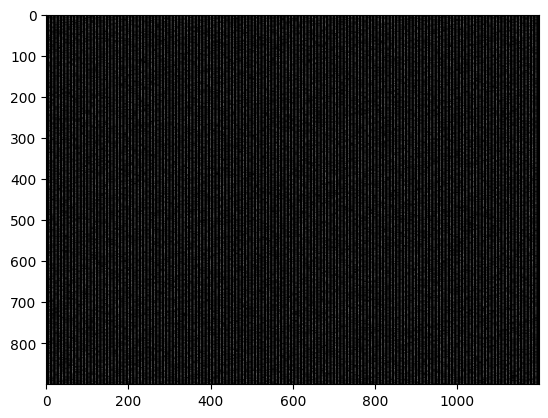

In [ ]:
import matplotlib.pyplot as plt

ruidito = t.randint(0, 256, (X.shape[1], X.shape[2]))
im = Image.fromarray(ruidito.numpy(), "L")
plt.imshow(im, cmap="gray")

## 11

In [ ]:
def f(x):
    return t.cos(x)


xx = float(input("dame el num inicializador"))
x = t.tensor(xx, requires_grad=True)
optimizer = optim.SGD([x], lr=1e-3)


for i in range(100):
    optimizer.zero_grad()
    f_x = f(x)
    f_x.backward()
    optimizer.step()

# punto mínimo
print(f"el mínimo local de {xx} es :{x}")

dame el num inicializador1
el mínimo local de 1.0 es :1.0863332748413086


## 12


In [ ]:
def f(x):
    return t.sin(x + 1) + x * t.cos(2 * x * x)


x = t.tensor(1.0, requires_grad=True)
x

tensor(1., requires_grad=True)

In [ ]:
# para efectos practicos ,usamos decensogradiente
optimizer = optim.SGD([x], lr=0.1)

In [ ]:
for _ in range(3000):
    y = f(x)
    optimizer.zero_grad()
    y.backward()
    optimizer.step()
    # if abs(y.item()) < 1e-6:  # Condición de convergencia (ajusta según sea necesario)
    # break


print("Raíz de la función:", x.item())

Raíz de la función: 0.8290555477142334


## 13

In [ ]:
# dado que tenemos dos variables x y y definimos las dos variables como
x = t.tensor(0.0, requires_grad=True)
y = t.tensor(0.0, requires_grad=True)
# el bucle de optimización  calculara la función objetivo, la restrictiva y lapérdida total.


def f(x, y):
    return t.sin(x) + t.cos(y + 1)


# Definir la ecuación que se debe satisfacer
def f2(x, y):  # 2 pasa al otro lado
    return t.sqrt(t.abs(x)) + t.log(1 + t.abs(y)) - 2


optimizer = optim.SGD([x, y], lr=0.1)

In [ ]:
for _ in range(3000):
    f_x = f(x, y)
    f_y = f2(x, y)
    # lapérdida total es la suma de la función objetivo y la ecuación
    loss = f_x + f_x
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

final_x = x.item()
final_y = y.item()

print("La raíz de la ecuación es x =", final_x, "y =", final_y)

La raíz de la ecuación es x = -1.5707961320877075 y = 2.141592264175415
